<a href="https://colab.research.google.com/github/FitriNurjanah/Deep-Learning-Lanjut-Tugas/blob/main/Model_WGAN_GP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow.keras import layers, Model, optimizers
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

# Install Kaggle API client
!pip install kaggle

# Create a directory for Kaggle credentials
!mkdir -p ~/.kaggle

# Move kaggle.json to the credentials directory
# The kaggle.json file is already present in the kernel, so we just need to move it
!mv /content/kaggle.json ~/.kaggle/

# Set permissions for the kaggle.json file
!chmod 600 ~/.kaggle/kaggle.json

# Download the CelebA dataset
!kaggle datasets download -d jessicali9530/celeba-dataset

# Unzip the dataset
!unzip -q celeba-dataset.zip -d /content/

# Konfigurasi
LATENT_DIM = 128
IMG_SIZE = 64
CHANNELS = 3
BATCH_SIZE = 64
GP_WEIGHT = 10.0

def get_dataset():
    # The dataset is now extracted to /content/img_align_celeba and /content/list_attr_celeba.csv
    attr_df = pd.read_csv("/content/list_attr_celeba.csv")
    # Male: 1, Female: 0
    attr_df['label'] = (attr_df['Male'] + 1) // 2

    # Update base_path to point to the extracted directory
    base_path = "/content/img_align_celeba/img_align_celeba/"
    paths = [os.path.join(base_path, f) for f in attr_df['image_id'][:10000]]
    labels = attr_df['label'][:10000].values

    def parse_image(path, label):
        img = tf.io.read_file(path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, [IMG_SIZE, IMG_SIZE])
        img = (img - 127.5) / 127.5  # Skala ke [-1, 1]
        return img, label

    ds = tf.data.Dataset.from_tensor_slices((paths, labels))
    ds = ds.map(parse_image, num_parallel_calls=tf.data.AUTOTUNE)
    return ds.shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

train_dataset = get_dataset()

Dataset URL: https://www.kaggle.com/datasets/jessicali9530/celeba-dataset
License(s): other
 99% 1.32G/1.33G [00:11<00:00, 170MB/s]
100% 1.33G/1.33G [00:11<00:00, 124MB/s]


In [2]:
def make_generator():
    noise = layers.Input(shape=(LATENT_DIM,))
    label = layers.Input(shape=(1,))

    # Kondisi Label
    li = layers.Embedding(2, LATENT_DIM)(label)
    li = layers.Flatten()(li)

    x = layers.Concatenate()([noise, li])
    x = layers.Dense(4 * 4 * 512)(x)
    x = layers.Reshape((4, 4, 512))(x)

    # Blok Upsampling
    for filters in [256, 128, 64]:
        x = layers.Conv2DTranspose(filters, 4, strides=2, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.ReLU()(x)

    out = layers.Conv2DTranspose(CHANNELS, 4, strides=2, padding='same', activation='tanh')(x)
    return Model([noise, label], out, name="Generator")

def make_critic():
    img = layers.Input(shape=(IMG_SIZE, IMG_SIZE, CHANNELS))
    label = layers.Input(shape=(1,))

    # Kondisi Label via Spasial
    li = layers.Embedding(2, IMG_SIZE * IMG_SIZE)(label)
    li = layers.Reshape((IMG_SIZE, IMG_SIZE, 1))(li)

    x = layers.Concatenate()([img, li])

    # Blok Downsampling
    for filters in [64, 128, 256]:
        x = layers.Conv2D(filters, 4, strides=2, padding='same')(x)
        x = layers.LeakyReLU(0.2)(x)
        x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)
    out = layers.Dense(1)(x)
    return Model([img, label], out, name="Critic")

gen_model = make_generator()
crit_model = make_critic()

In [3]:
c_opt = optimizers.Adam(2e-4, beta_1=0.5, beta_2=0.9)
g_opt = optimizers.Adam(2e-4, beta_1=0.5, beta_2=0.9)

@tf.function
def train_step(real_imgs, labels):
    batch_size = tf.shape(real_imgs)[0]

    # 1. Update Critic
    for _ in range(1): # Bisa ditingkatkan ke 5 untuk WGAN standar
        with tf.GradientTape() as c_tape:
            z = tf.random.normal((batch_size, LATENT_DIM))
            fake_imgs = gen_model([z, labels], training=True)

            # Wasserstein Loss
            c_real = crit_model([real_imgs, labels], training=True)
            c_fake = crit_model([fake_imgs, labels], training=True)
            c_wass = tf.reduce_mean(c_fake) - tf.reduce_mean(c_real)

            # Gradient Penalty
            alpha = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)
            interp = real_imgs + alpha * (fake_imgs - real_imgs)
            with tf.GradientTape() as gp_tape:
                gp_tape.watch(interp)
                pred = crit_model([interp, labels], training=True)
            grads = gp_tape.gradient(pred, [interp])[0]
            norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
            gp = tf.reduce_mean((norm - 1.0)**2)

            total_c_loss = c_wass + GP_WEIGHT * gp

        c_grads = c_tape.gradient(total_c_loss, crit_model.trainable_variables)
        c_opt.apply_gradients(zip(c_grads, crit_model.trainable_variables))

    # 2. Update Generator
    with tf.GradientTape() as g_tape:
        z = tf.random.normal((batch_size, LATENT_DIM))
        gen_imgs = gen_model([z, labels], training=True)
        g_fake = crit_model([gen_imgs, labels], training=True)
        g_loss = -tf.reduce_mean(g_fake)

    g_grads = g_tape.gradient(g_loss, gen_model.trainable_variables)
    g_opt.apply_gradients(zip(g_grads, gen_model.trainable_variables))

    return total_c_loss, g_loss

Epoch 1/20
C Loss: -8.8980 | G Loss: 33.0052
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


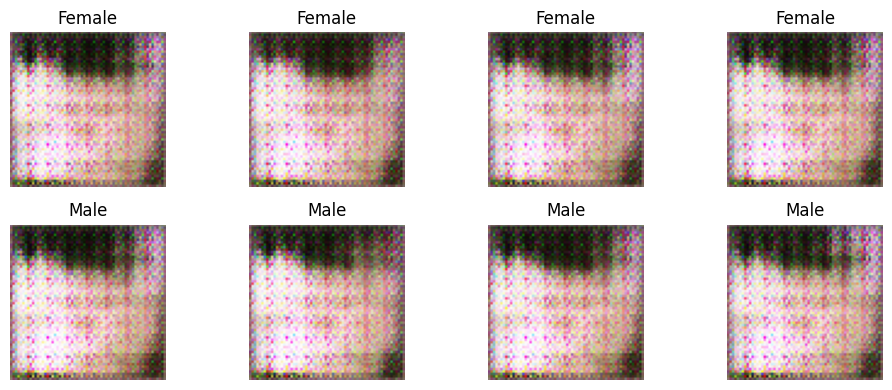

Epoch 2/20
C Loss: -16.2577 | G Loss: -10.0587
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


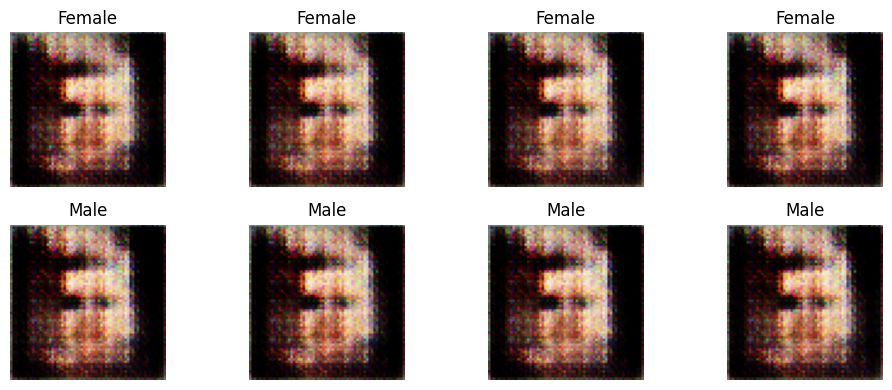

Epoch 3/20
C Loss: 2.0912 | G Loss: 4.2184
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


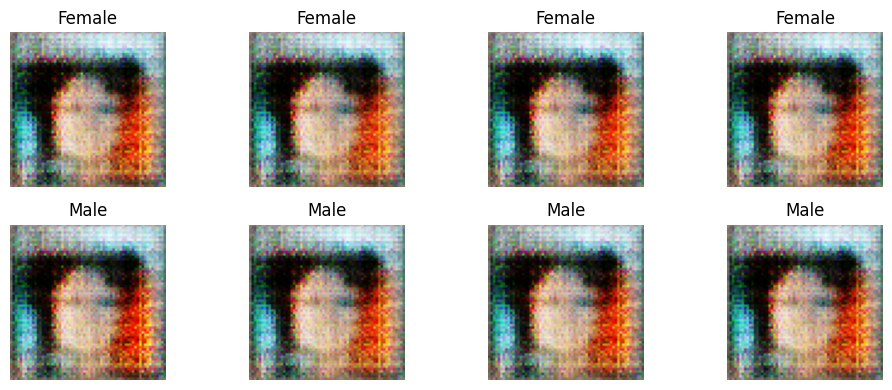

Epoch 4/20
C Loss: -7.7876 | G Loss: 25.7218
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


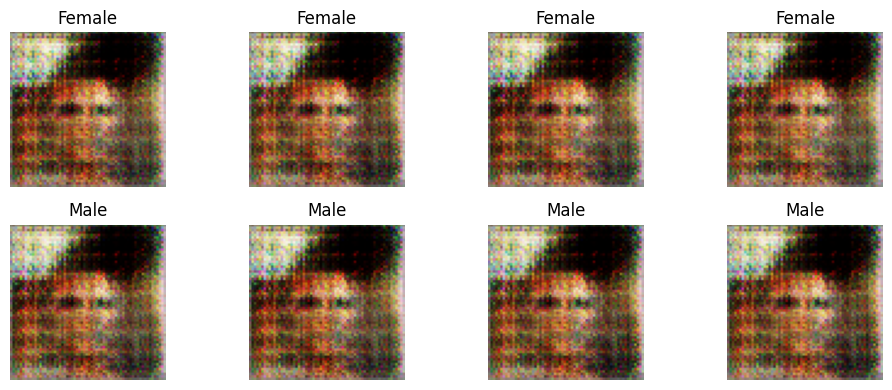

Epoch 5/20
C Loss: -18.0105 | G Loss: -11.7367
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


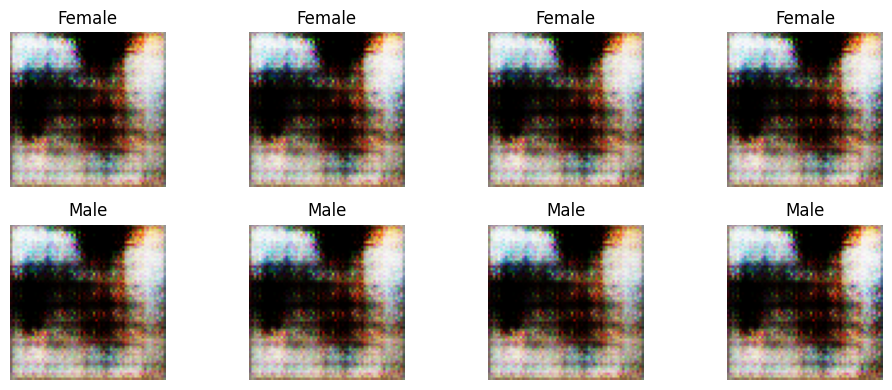

Epoch 6/20
C Loss: -4.6178 | G Loss: -15.5211
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


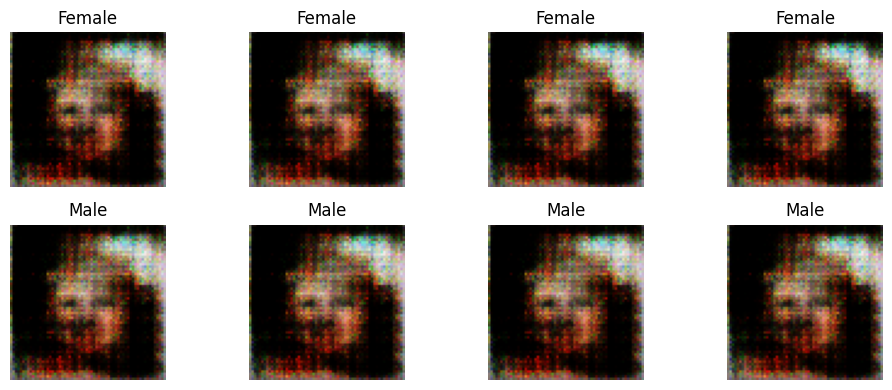

Epoch 7/20
C Loss: 3.2681 | G Loss: 45.1627
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


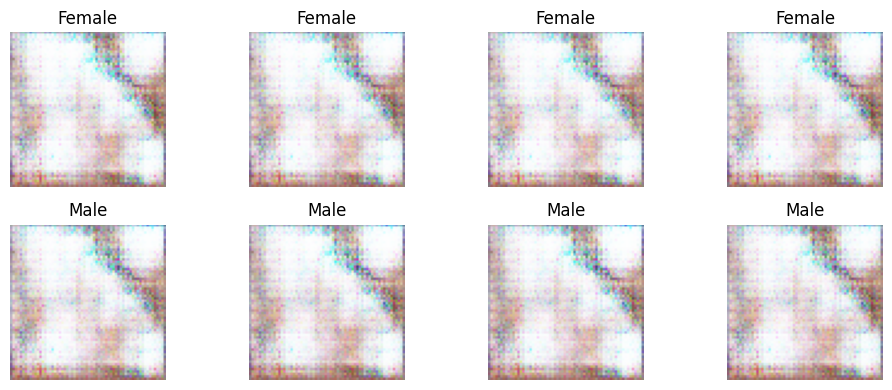

Epoch 8/20
C Loss: -20.7298 | G Loss: -1.6148
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


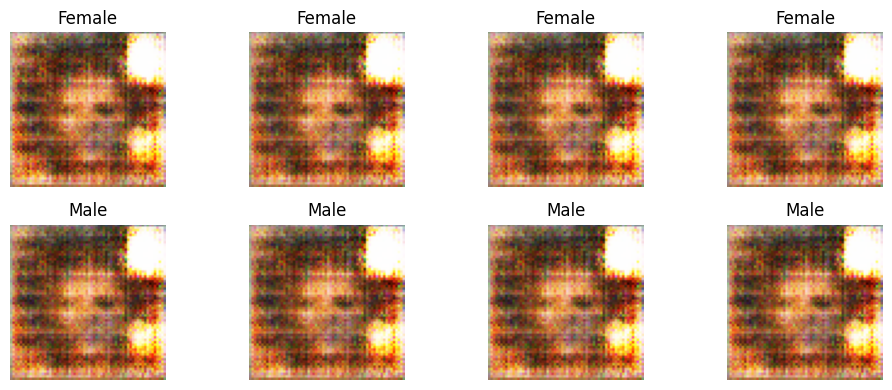

Epoch 9/20
C Loss: -5.3293 | G Loss: 38.3389
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


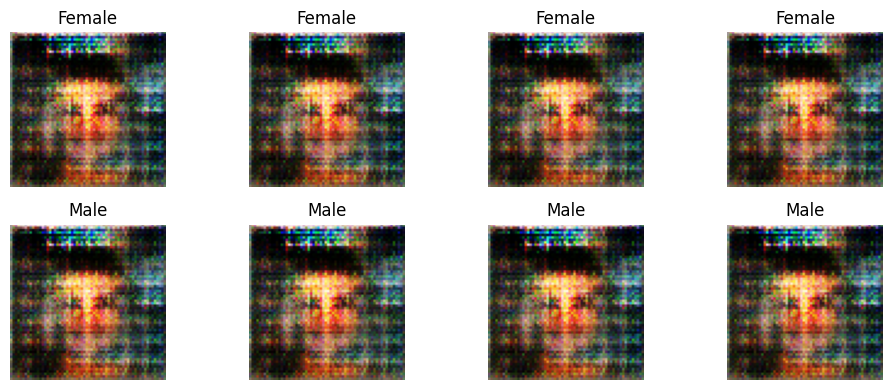

Epoch 10/20
C Loss: -24.2796 | G Loss: -41.4738
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


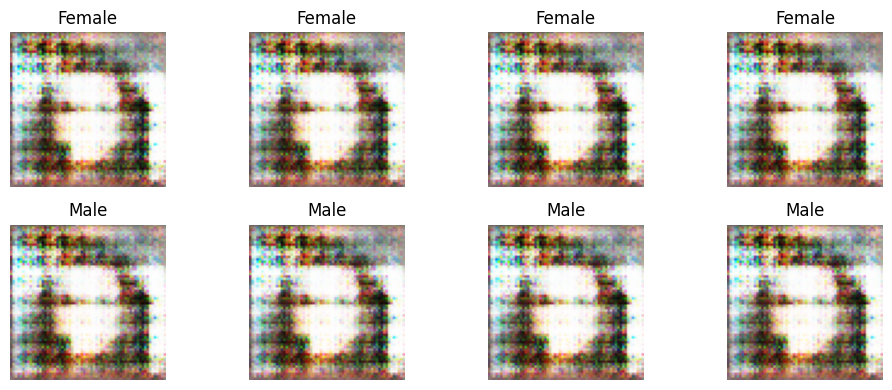

Epoch 11/20
C Loss: -30.4985 | G Loss: -55.1032
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


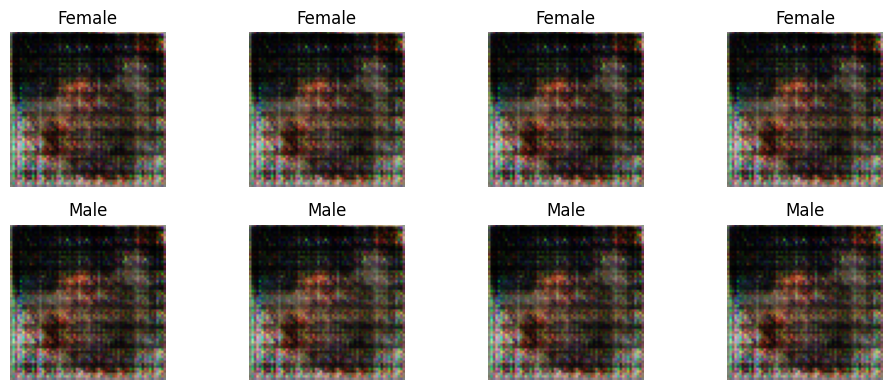

Epoch 12/20
C Loss: -11.3105 | G Loss: -35.0787
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


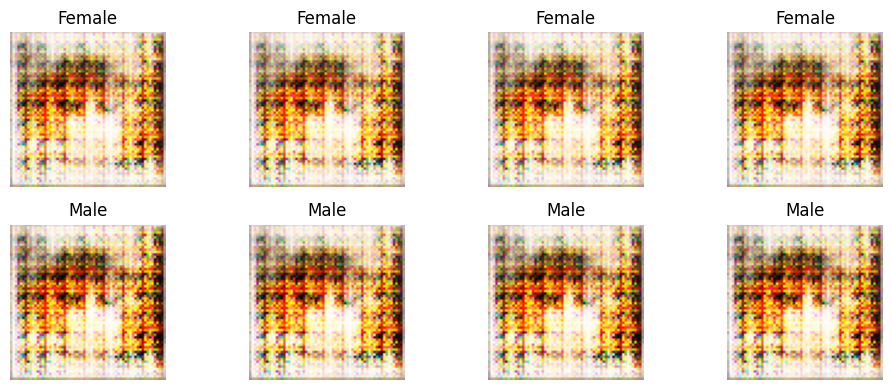

Epoch 13/20
C Loss: -39.5929 | G Loss: 0.6356
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


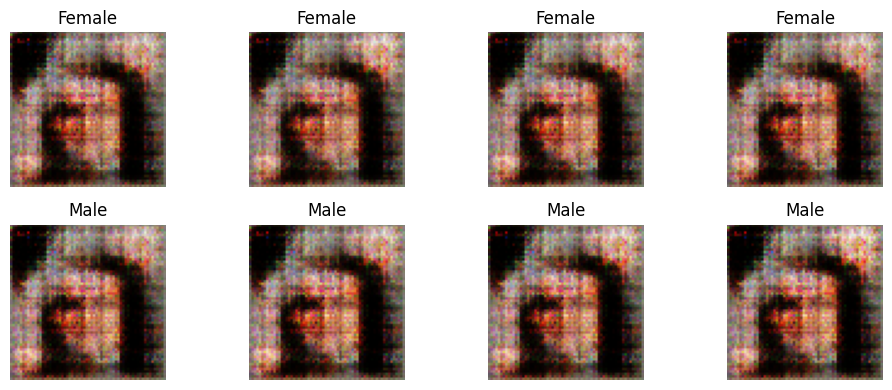

Epoch 14/20
C Loss: 12.0289 | G Loss: -102.8440
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


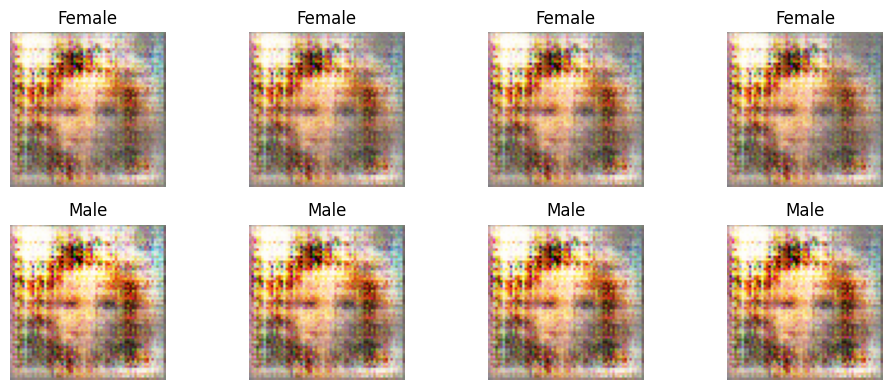

Epoch 15/20
C Loss: 1.0683 | G Loss: -65.7451
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


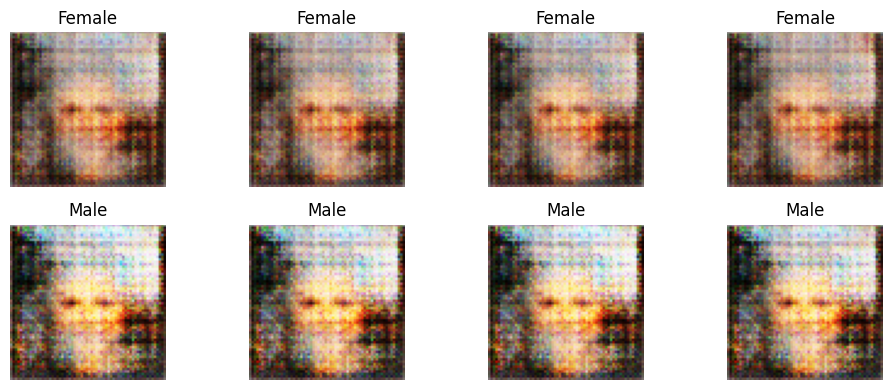

Epoch 16/20
C Loss: -0.8047 | G Loss: 32.2542
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


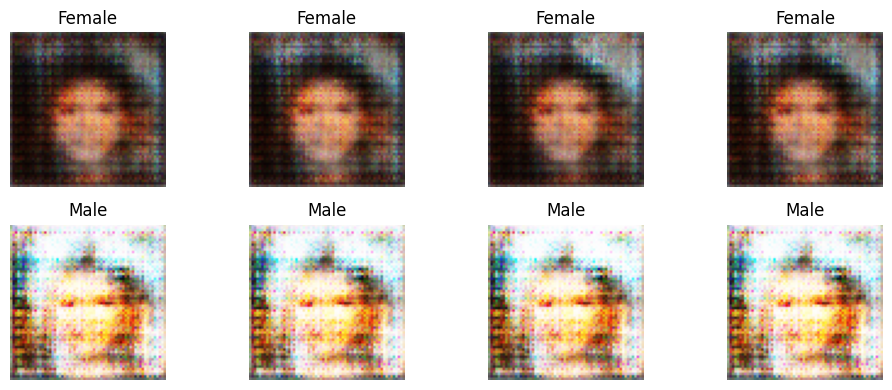

Epoch 17/20
C Loss: -2.7736 | G Loss: -19.1687
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


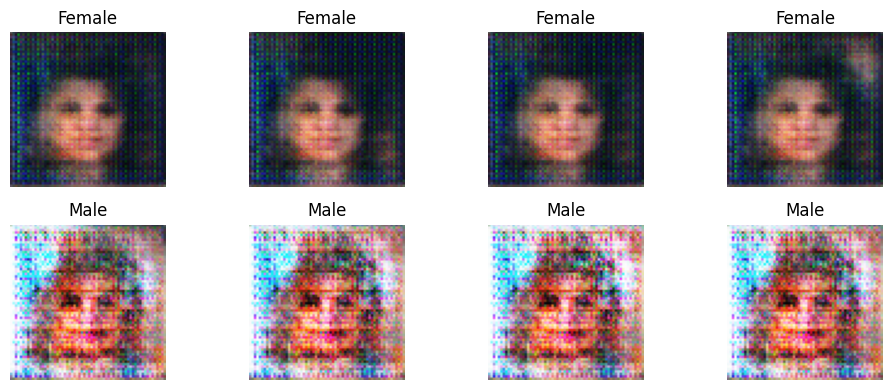

Epoch 18/20
C Loss: 1.5601 | G Loss: -11.6634
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


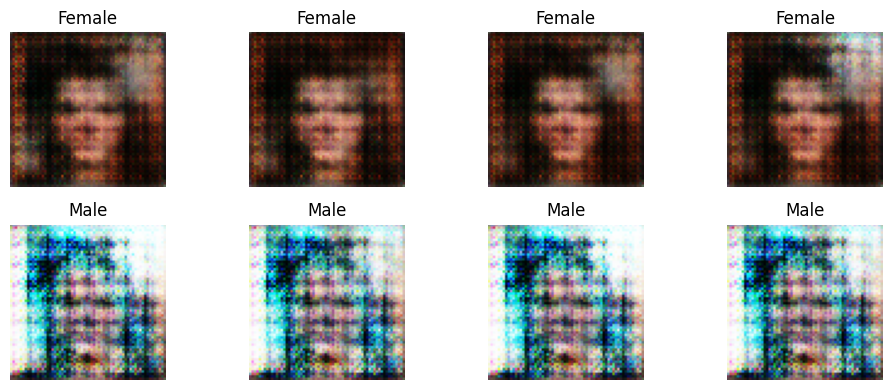

Epoch 19/20
C Loss: -3.0934 | G Loss: 0.9990
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


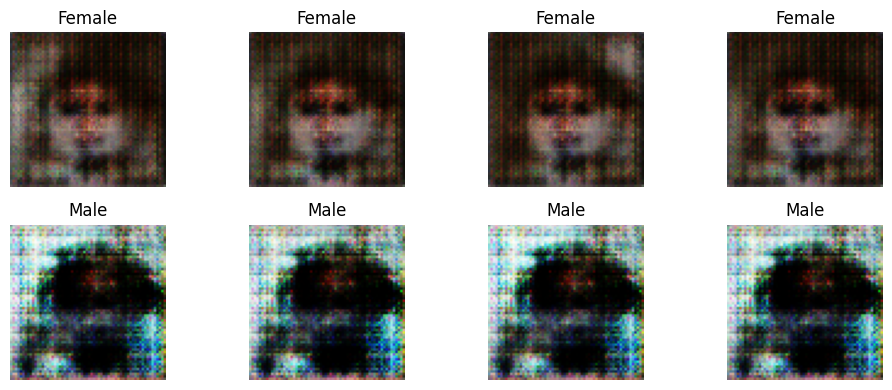

Epoch 20/20
C Loss: -7.3912 | G Loss: -101.2085
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


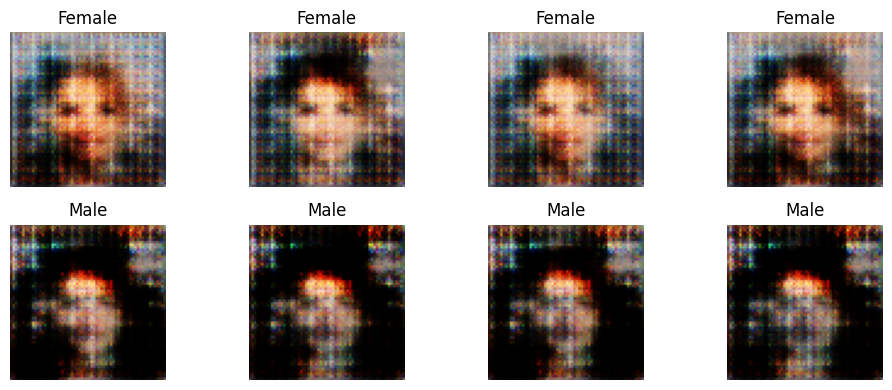

In [4]:
def plot_results(epoch, gen):
    z = tf.random.normal((8, LATENT_DIM))
    labels = np.array([0]*4 + [1]*4).reshape(-1, 1)
    imgs = gen.predict([z, labels])
    imgs = (imgs * 127.5 + 127.5).astype('uint8')

    plt.figure(figsize=(10, 4))
    for i in range(8):
        plt.subplot(2, 4, i+1)
        plt.imshow(imgs[i])
        plt.title("Female" if i < 4 else "Male")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

epochs = 20
for epoch in range(epochs):
    print(f"Epoch {epoch+1}/{epochs}")
    for real_imgs, labels in train_dataset:
        c_loss, g_loss = train_step(real_imgs, labels)

    print(f"C Loss: {c_loss:.4f} | G Loss: {g_loss:.4f}")
    plot_results(epoch, gen_model)